## Large Scale Optimization TP2: Spectral spectroscopy

#### Samuel Bazaz Jazayeri

## Reconstruction of DOSY NMR signals - Part1 

In [32]:
############
# Packages #
############
import time as t
import numpy as np
import pandas as pd
from numba import jit
from scipy.special import lambertw
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt 
import plotly.express as px
import plotly.io as pio
from typing import Dict, Union, List, Tuple, Any, Callable, Optional
pio.renderers.default = "plotly_mimetype+notebook"

from sklearn.metrics import mean_squared_error

##############
# global var #
##############
origin_signal = pd.read_csv('signal_spectroscopy.txt' ,header=None , sep=' ')[2]

############
# plotting #
############
def plot_signal(vec, title = "signal"):
    fig = px.line(vec, template = "plotly_dark", title = title)
    fig.show()

def plot_xbar_T(xb, arr_T, name = "xbar"):
    df = pd.DataFrame({"T":arr_T, "xbar":xb})
    fig = px.line(df, x="T", y="xbar", template = "plotly_dark", title = f"<b>diffusion distribution {name}</b>")
    fig.show()

def plot_estim(xb, true_x, name = "estimate xbar", color = "red"):
    fig = px.line(xb, template = "plotly_dark", title = f"<b>{name}</b>")
    fig.add_traces(
    list(px.line(true_x.copy()).select_traces())
    )
    fig.data[0].line.color = color
    fig.show()

def plot_nqerror(f_score, arr_beta, name = "smoothness prior"):
    df = pd.DataFrame({"beta":arr_beta, "normalized quadratic error":f_score(arr_beta)})
    best_beta = df.loc[df["normalized quadratic error"].argmin(), "beta"]
    fig = px.line(df, x="beta", y="normalized quadratic error", template = "plotly_dark", title = f"<b>Normalized quadratic error {name}, best beta = {np.round(best_beta, 3)}</b> logscale", log_x=True)
    fig.show()

Une première étape avant de construire le signal observé est de visulaiser le signal d'origine qui sera notre objectif à atteindre.

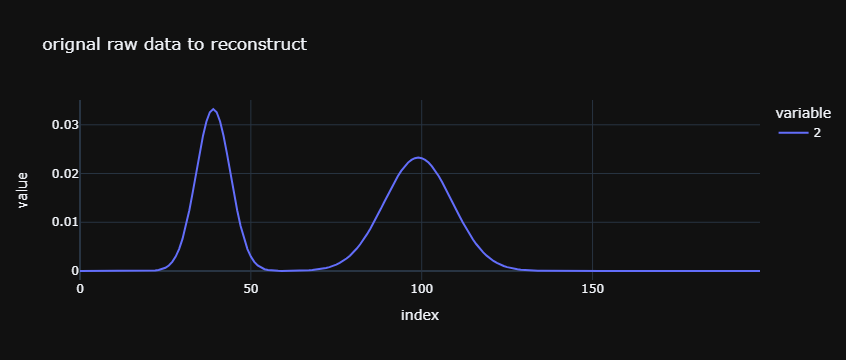

In [3]:
plot_signal(origin_signal, title = "orignal raw data to reconstruct")

### 1,2,3-Creation de $\bar{x}$

On définit t et T qui servirons à la construction de K, la transformation linéaire de notre signal.

In [5]:
def get_exponential_sampling(tmin=1, tmax=1000, npoints = 200):
    return tmin*np.exp(-(np.log(tmin/tmax)/(npoints-1)) * np.arange(npoints)  )

def get_regular_sampling(tmin=0, tmax=1.5, npoints = 50):
    return tmin+((tmax-tmin)/(npoints-1)) * np.arange(npoints)

In [6]:
arr_T = get_exponential_sampling()
arr_t = get_regular_sampling()

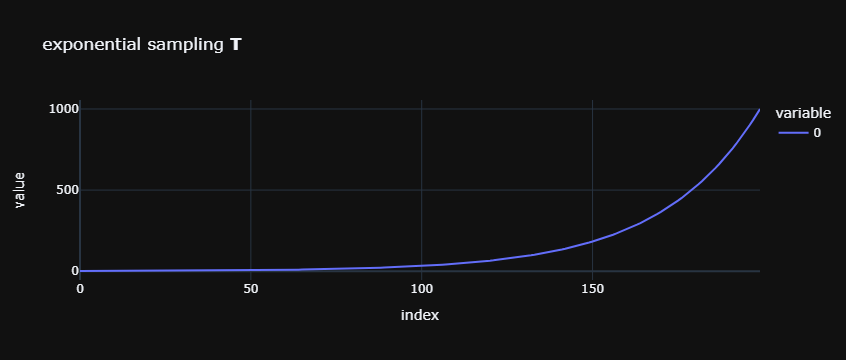

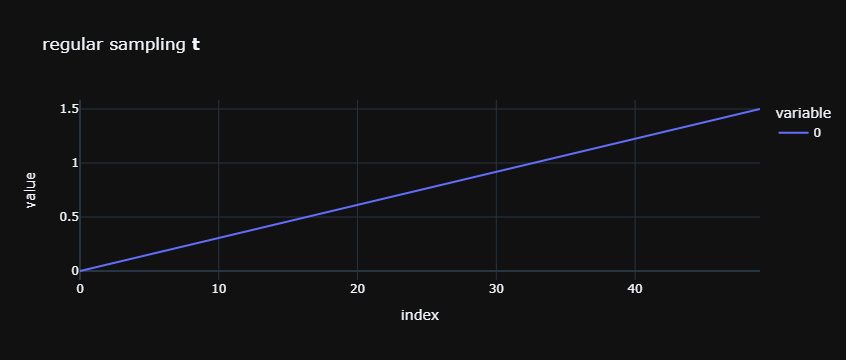

In [7]:
plot_signal(arr_T, title = "exponential sampling <b>T</b>")
plot_signal(arr_t, title = "regular sampling <b>t</b>")

On peut ensuite observer x en fonction de T:

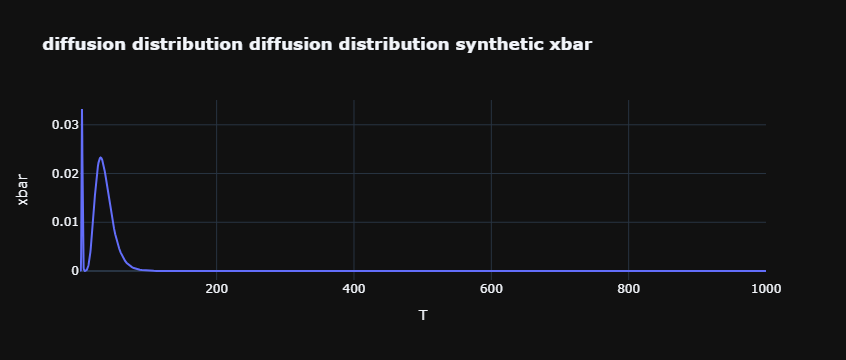

In [9]:
plot_xbar_T(origin_signal, arr_T, name = "diffusion distribution synthetic xbar")

Maintenant construisons le signal observé à partir de la matrice K puis d'un bruit Gaussien.

#### 5-Matrice K

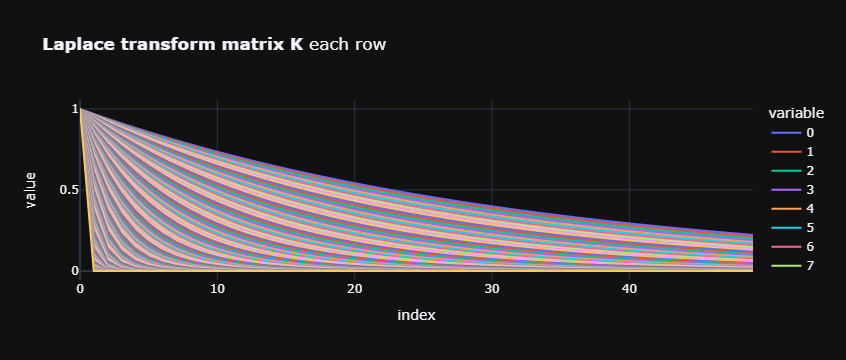

In [12]:
def get_mat_k(arr_T, arr_t):
    nT = arr_T.shape[0]
    nt = arr_t.shape[0]
    rep_T = np.tile(arr_T, nt).reshape(nt, nT)
    rep_t = np.tile(arr_t, nT).reshape(nT, nt)
    return  np.exp( - rep_t.T * rep_T )

mat_K = get_mat_k(arr_T, arr_t)
plot_signal(mat_K, title = "<b>Laplace transform matrix K</b> each row ")

#### 6,7-synthetic data y

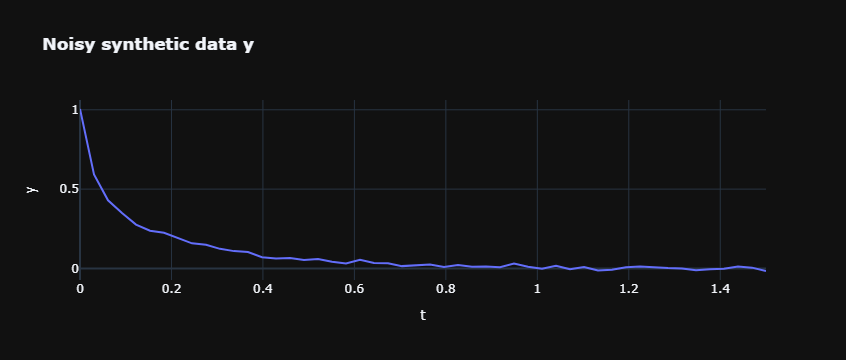

In [13]:
def get_z(xbar, K):
    return K@xbar
    
def get_noisy_data_y(xbar, K, sigma = 1e-2):
    nt = K.shape[0]
    w = np.random.multivariate_normal(mean=np.zeros(nt), cov=(sigma**2)*np.eye(nt), size=1)[0]
    return get_z(xbar, K)+ w

np.random.seed(seed=42)
noisy_data = get_noisy_data_y(origin_signal, mat_K, sigma = 1e-2)
df_y = pd.DataFrame({"t":arr_t, "y":noisy_data})

fig = px.line(df_y, x="t", y="y", template = "plotly_dark", title = "<b>Noisy synthetic data y</b>")
fig.show()

Nous allons chercher à reconstruire notre distribution de diffusion $\bar{x}$ à partir du signal bruité y et de la transformé de Laplace dont la forme discrète est donnée par K. Pour se faire nous allons chercher à minimiser la norme quadratique de l'erreur entre la tranformé de Laplace du candidat et le signal bruité, tout en ayant un terme de régularisation pour pénalisé le "bruit gaussien".

## 3 Comparison of regularization strategies

On commence par étudier l'existence des solutions pour $\beta=0$ et pour la première régularisation à partir de l'inversibilité de certaines matrices.

In [14]:
print(np.linalg.det(mat_K.T @mat_K))

0.0


Donc on a pas de garantis de convergence vers l'optimal pour le cas  $\beta=0$.

### Smoothness prior

Maintenant construisons la matrice D de différentiation avec la convention circulaire.

In [17]:
def get_dis_grad(npoints = 200):
    mat_d = np.eye(npoints)
    mat_d[1:npoints, :npoints-1] -= np.eye(npoints-1)
    mat_d[0, npoints-1]=-1
    return mat_d

print("D=\n", get_dis_grad(npoints = 5))
mat_D = get_dis_grad(npoints = 200)
print("det(D^tD)=\n",np.linalg.det(mat_D.T @mat_D))

D=
 [[ 1.  0.  0.  0. -1.]
 [-1.  1.  0.  0.  0.]
 [ 0. -1.  1.  0.  0.]
 [ 0.  0. -1.  1.  0.]
 [ 0.  0.  0. -1.  1.]]
det(D^tD)=
 8.837152115609339e-14


On a donc inversibilité du terme du gradient dépendant de x ce qui nous permet de déduire l'optimum par une formule close pour le premier cas.

In [18]:
def get_optimum_with_soothness_prior(y,mat_K, mat_D, beta = 1):
    return np.linalg.inv(mat_K.T @mat_K + beta * mat_D.T @mat_D) @ mat_K.T @ y

f_estime_smooth = lambda beta: get_optimum_with_soothness_prior(noisy_data, mat_K, mat_D, beta = beta) 

In [19]:
x_smooth_prior  = f_estime_smooth(2)

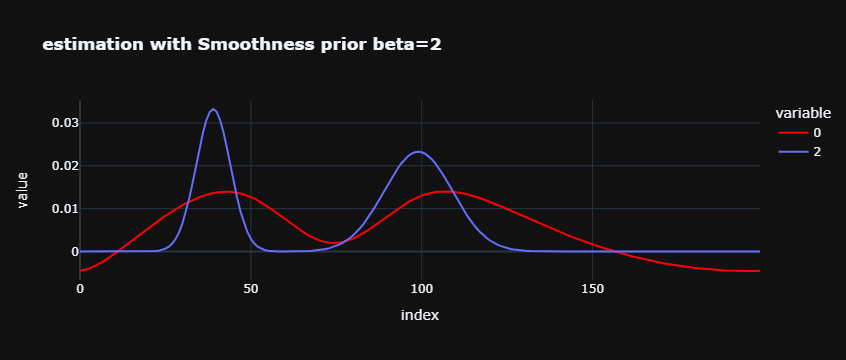

In [20]:
plot_estim(x_smooth_prior, origin_signal, name = "estimation with Smoothness prior beta=2")

On remarque que la reconstruction reproduit bien les deux modes mais atteint des valeures négatives d'une part et semble bien trop étalée.

#### fine tuning beta

On regarde maintenant le parametre optimal à partir de l'erreur quadratique normalisée.

In [266]:
def get_nqerror(origin_signal, beta, f_estim):
    estim = f_estim(beta)
    norm_bar2 = np.sum(origin_signal**2)
    norm_diff2 = np.sum((origin_signal-estim)**2)
    return norm_diff2/norm_bar2

def vectorize_and_plot_nqerror(f_estim, range_beta = np.logspace(-2, 2, 100), name = "smoothness prior"):
    f_score = lambda  beta: get_nqerror(origin_signal, beta, f_estim)
    f_score = np.vectorize(f_score)
    plot_nqerror(f_score, range_beta, name = name)

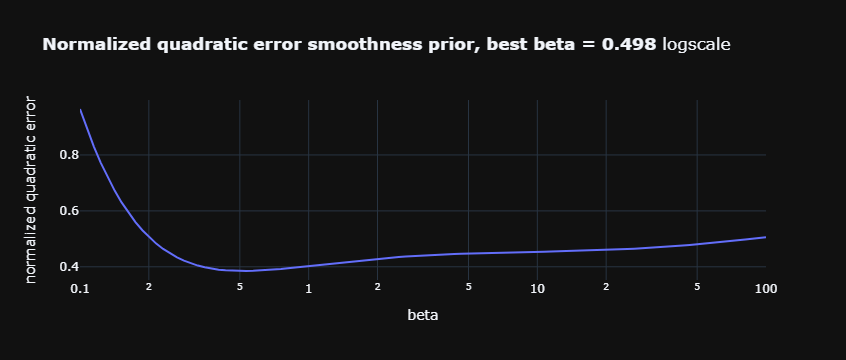

In [265]:
vectorize_and_plot_nqerror(f_estime_smooth, range_beta = np.logspace(-1, 2, 100), name = "smoothness prior")

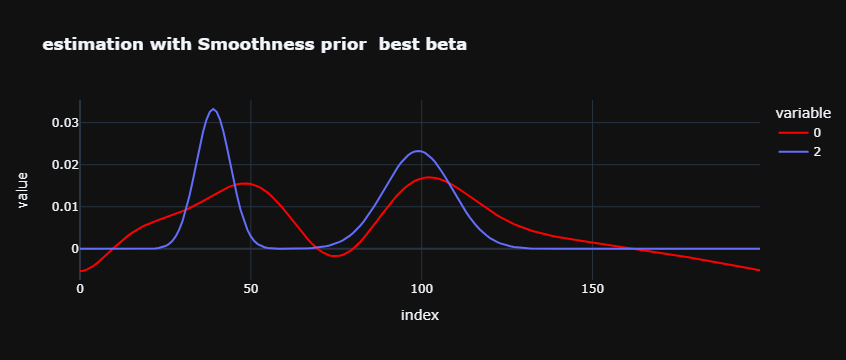

In [267]:
plot_estim(f_estime_smooth(0.498), origin_signal, name = "estimation with Smoothness prior  best beta")

L'amplitude des modes est un peu meilleure une fois le paramètre optimisé, mais la gamme de valeure de x n'est pas respectée. On utilisera tout de même cette reconstruction comme point de départ pour les prochains algorithmes car son aclcul est rapide.

### Smoothness prior + constraints


On ajoute ici une contrainte sur le min et le max que peu atteindre notre signal reproduit, en utilisant un peu de l'information de notre signal à atteindre.

In [29]:
def get_min_max(arr):
    return np.min(arr), np.max(arr)

@jit(nopython=True)
def proj_pave(arr, vmin, vmax):
    arr2 = arr.copy()
    arr2[arr<vmin] = vmin
    arr2[arr>vmax] = vmax
    return arr2

xmin, xmax = get_min_max(origin_signal)
print(f"min={np.round(xmin,3)}, max={np.round(xmax,3)}")

min=0.0, max=0.033


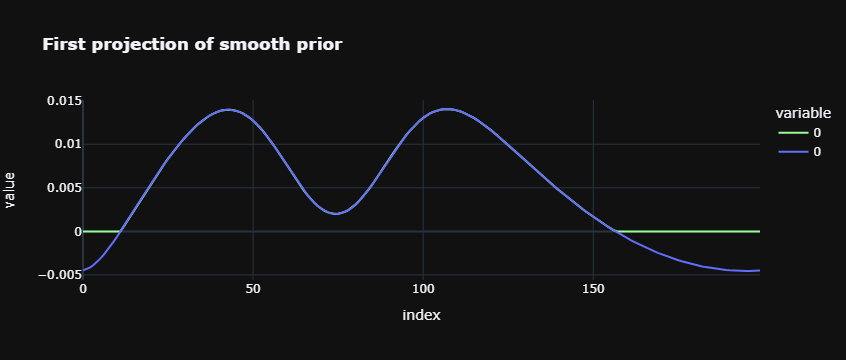

In [33]:
plot_estim(proj_pave(x_smooth_prior, xmin, xmax), x_smooth_prior, name = "First projection of smooth prior", color = "palegreen")

On remarque que la première projection sur la solution précédante permet belle et bien de retomber sur le bon intervale pour x. On réalise ensuite un gradient projeté pour la reconstruction de notre signal.

In [78]:
@jit(nopython=True)
def projected_gradient_smooth_prior(y, mat_K, mat_D, xmin, xmax, beta = 1, maxiter=1000, stop_eps = 1e-8):
    M = mat_K.T @mat_K + beta * mat_D.T @mat_D
    xn = np.linalg.inv(M) @ mat_K.T @ y
    nu = np.max(np.linalg.eigvals(M))
    grad = lambda x : M @ x - mat_K.T @ y
    
    # lmbda = lambda n : (3/2) / np.log(n+2)
    # lmbda = lambda n : (3/2) / (n+1)
    lmbda = lambda n : 0.8
    for n in range(maxiter):
        gradn = grad(xn)
        if n>0 and np.linalg.norm(gradn)<stop_eps:
            break
        u = xn-(1/nu)*gradn
        xn = xn + lmbda(n)* (proj_pave(u, xmin, xmax) -xn ) 
    return xn

f_estime_smooth_constraint = lambda beta: projected_gradient_smooth_prior(noisy_data, mat_K, mat_D, xmin, xmax, beta = beta, maxiter=1000) 

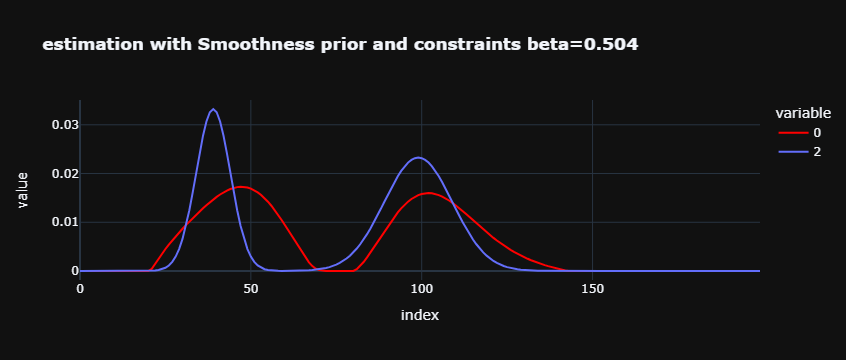

In [79]:
x_smooth_prior_and_constraint = f_estime_smooth_constraint(0.504)
plot_estim(x_smooth_prior_and_constraint, origin_signal, name = "estimation with Smoothness prior and constraints beta=0.504")

On observe une meilleure reconstruction en terme de plage de valeurs, cependant on perd ce faisant la différentiabilité de notre signal reconstruit. Cherchons encore une fois le paramètre optimal.

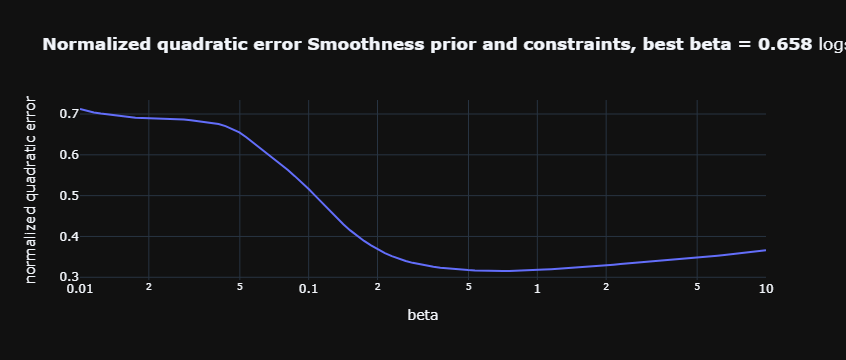

In [270]:
vectorize_and_plot_nqerror(f_estime_smooth_constraint, range_beta = np.logspace(-2, 1, 100), name = "Smoothness prior and constraints")

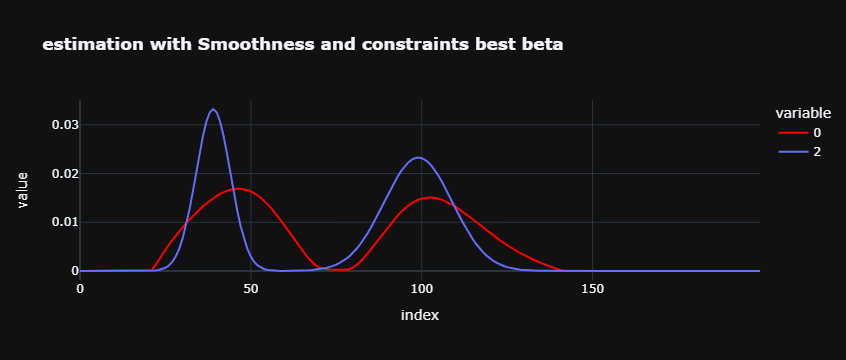

In [82]:
plot_estim(f_estime_smooth_constraint(0.658), origin_signal, name = "estimation with Smoothness and constraints best beta")

### Sparsity prior

Ici nous faisons une régularisation dit LASSO. Cela permet d'obtenir une représentation sparse c'est à dire avec peu de valeurs non nuls.

In [116]:
@jit(nopython=True)
def prox_beta_l1(arr, beta):
    prox = np.zeros(arr.shape[0])
    prox[arr<-beta] = arr[arr<-beta] + beta
    prox[arr>beta] = arr[arr>beta] - beta
    return prox

Regardons déjà l'effet du proximal associée sur la reconstruction smooth.

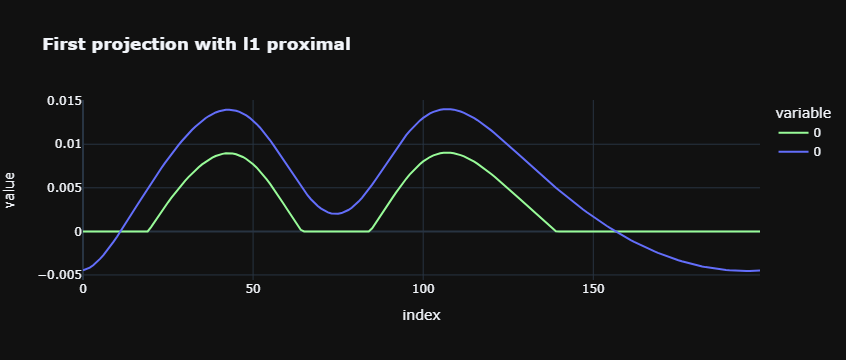

In [49]:
plot_estim(prox_beta_l1(x_smooth_prior, 5e-3), x_smooth_prior, name = "First projection with l1 proximal", color="palegreen" )

In [123]:
print(origin_signal.shape)

(200,)


Remarquons que pour que le proximal ne soit pas nul, il faut prendre beta de l'ordre de xbar : $5*10^{-3}$
Nous utilsons ensuite un forward backward pour la reconstruction.

In [155]:
@jit(nopython=True)
def forward_backward_spars_prior(y, mat_K, mat_D, beta = 1, maxiter=1000, stop_eps = 1e-6):
    mat2 = mat_K.T @mat_K
    M = mat2 + beta * mat_D.T @mat_D
    nu = np.max(np.linalg.eigvals(M))
    xn = np.linalg.inv(M) @ mat_K.T @ y
    # xn = np.ones(200)
    grad = lambda x : mat2 @ x - mat_K.T @ y
    #lmbda = lambda n : (3/2) / np.log(n+2)
    # lmbda = lambda n : (3/2) / (n+1)
    lmbda = lambda n : 0.8
    for n in range(maxiter):
        gradn = grad(xn)
        if n>0 and np.linalg.norm(gradn)<1e-8:
            break
        u = xn-(1/nu)*gradn
        xn = xn + lmbda(n)* (prox_beta_l1(u, (1/nu)*beta)-xn ) 
    return xn

In [151]:
f_estime_spars_prior = lambda beta: forward_backward_spars_prior(noisy_data, mat_K, mat_D, beta = beta, maxiter=2000) 

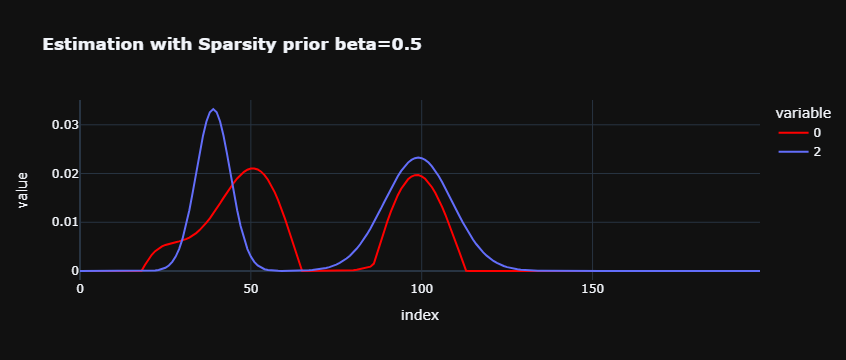

In [156]:
x_spars_prior = f_estime_spars_prior(0.142)
plot_estim(x_spars_prior, origin_signal, name = "Estimation with Sparsity prior beta=0.5")

On obtient toujours une reconstruction peu régulière ce qui est logique car la norme 1 n'est pas différentiable.

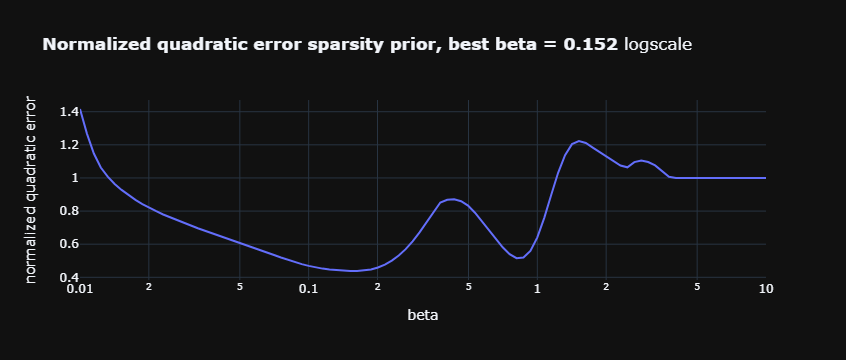

In [271]:
vectorize_and_plot_nqerror(f_estime_spars_prior, range_beta = np.logspace(-2, 1, 100), name = "sparsity prior")

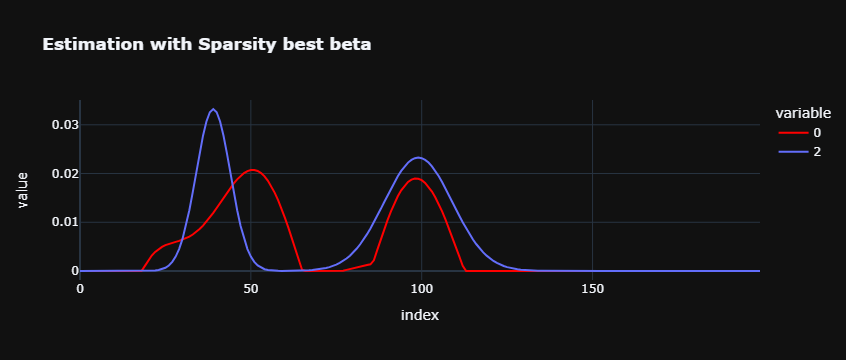

In [145]:
plot_estim(f_estime_spars_prior(0.152), origin_signal, name =  "Estimation with Sparsity best beta")

On remarque que l'on retrouve un signal avec peu d'activations, qui est moins smooth que le cas précédent.

## Reconstruction of DOSY NMR signals - Part2 : entropy regularization 

### Forward Backward

On commence par construire la fonctionde de Lambert dans sa branche 0.

In [157]:
@jit(nopython=True)
def lambert0(arr, maxiter=1000):
    lamb = np.ones(arr.shape[0])
    for n in range(maxiter):
        previouslamb = lamb.copy()
        lamb = lamb - (lamb*np.exp(lamb) - arr)/((1+lamb)*np.exp(lamb))
        if n>0 and np.linalg.norm(previouslamb-lamb)<1e-3:
            break
    return lamb  

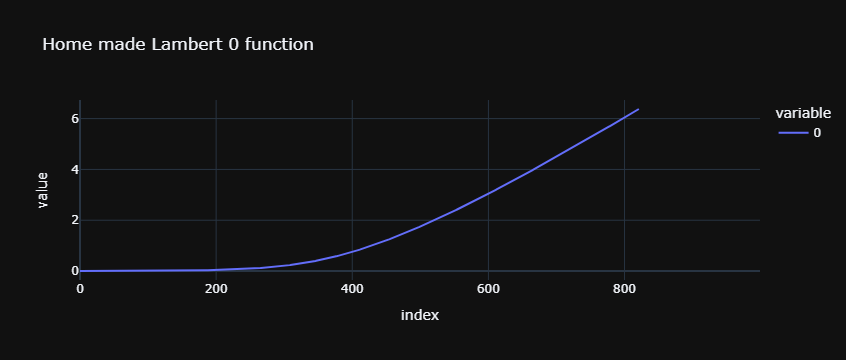

In [158]:
plot_signal(lambert0(np.logspace(-3, 5, 1000), maxiter=1000), "Home made Lambert 0 function")

On utilisera cependant la fonction Scipy qui semble plus robuste.

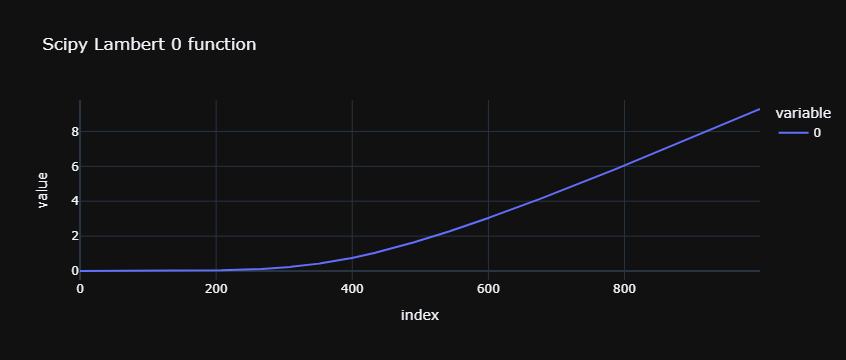

In [160]:
plot_signal(np.real(lambertw(np.logspace(-3, 5, 1000))), "Scipy Lambert 0 function")

In [ ]:
plot_signal(np.real(lambertw(np.logspace(-3, 5, 1000))), "Scipy Lambert 0 function")

On ajoute un seuillage pour éviter les problèmes d'overflow.

In [347]:
def prox_gamma_entropy(arr, gamma):
    arr2 = arr/(1e-8+gamma) - 1 - np.log(1e-8+gamma)

    underflow_val = arr2<-1
    arr2[underflow_val] = -1
    
    overflow_val = arr2>7e2
    no_overflow = (arr2<=7e2)
    #asymptotique decomposition
    lamber = arr2.copy()
    
    lamber[no_overflow] = np.real(lambertw(np.exp(arr2[no_overflow])))
    #arr2 = np.clip(arr2, a_min = -1e3, a_max = 7e2)  
    # arr2 = np.exp(arr2)
    # return gamma * np.real(lambertw(arr2))
    return gamma * lamber

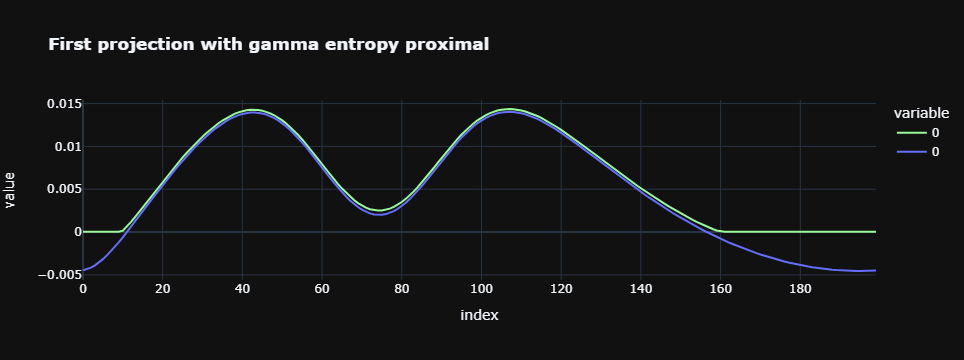

In [324]:
plot_estim(prox_gamma_entropy(x_smooth_prior, 1e-4), x_smooth_prior, name = "First projection with gamma entropy proximal", color = "palegreen")

In [325]:
@jit(nopython=True)
def forward_backward_ent_prior(y, mat_K, mat_D, beta = 1e-2, maxiter=1000, stop_eps = 1e-9):
    mat2 = mat_K.T @mat_K
    M = mat2 + beta * mat_D.T @mat_D
    nu = np.max(np.linalg.eigvals(M))
    xn = np.ones(200)
    lmbda = lambda n : 0.8
    grad = lambda x : mat2 @ x - mat_K.T @ y
    prox = lambda u : prox_gamma_entropy(u,(1/nu)*beta)
        
    for n in range(maxiter):
        gradn = grad(xn)
        if n>0 and np.linalg.norm(gradn)<stop_eps:
            break
        u = xn-(1/nu)*gradn
        xn = xn + lmbda(n)* (prox(u)-xn) 
    return xn

f_estime_ent_fb = lambda beta: forward_backward_ent_prior(noisy_data, mat_K, mat_D, beta = beta, maxiter=3000, stop_eps = 1e-6)

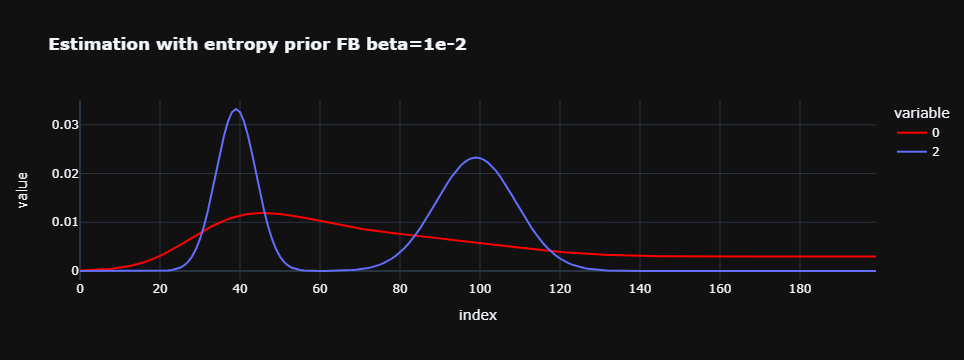

In [326]:
plot_estim(
    f_estime_ent_fb(1e-2),
    origin_signal, name = "Estimation with entropy prior FB beta=1e-2"
)

La reconstruction est peu qualitative, en partie en raison du seuillage dans la fonction proximal. En effet sans ce dernier nous rencontrons un overflow.

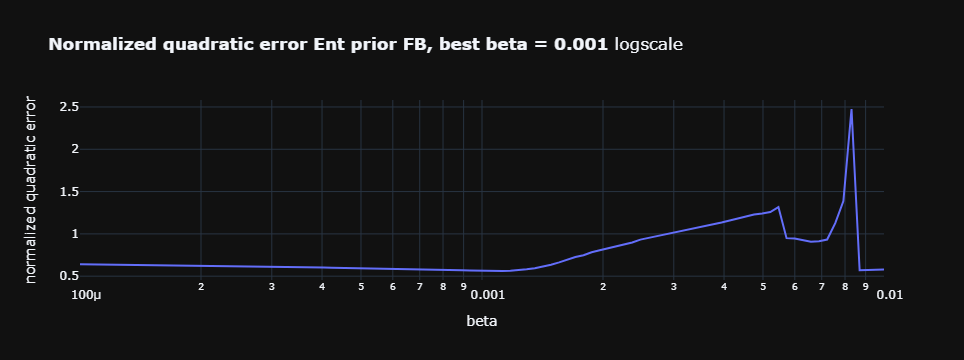

In [327]:
vectorize_and_plot_nqerror(f_estime_ent_fb, range_beta = np.logspace(-3, 1, 50), name = "Ent prior FB")

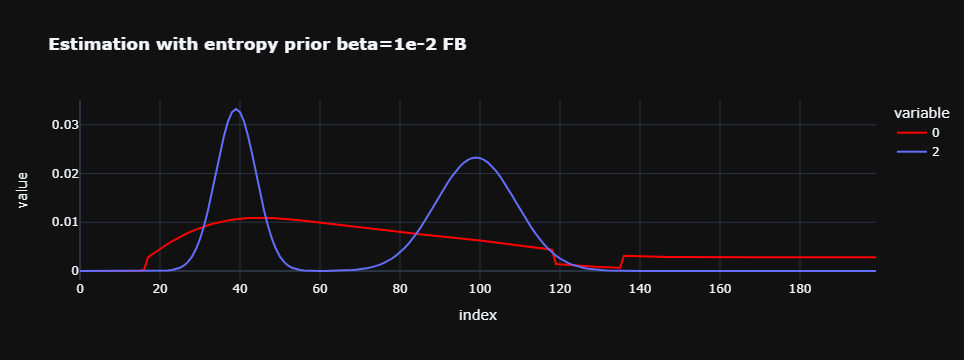

In [332]:
plot_estim(
    f_estime_ent_fb(1e-3),
    origin_signal, name = "Estimation with entropy prior beta=1e-2 FB"
)

La minimisation de l'erreur ne conduit pas à une solution satisfaisante.

### Douglas Rachford

In [345]:
def douglas_ent_prior(y, mat_K, beta = 1e-2, maxiter=1000):
    mat2 = mat_K.T @mat_K
    xn = np.ones(200)
    γ = 1e-2
    lmbda = lambda n : 0.8
    prox = lambda u : prox_gamma_entropy(u,γ*beta)
    prox_quad = lambda w : np.linalg.inv(np.eye(mat2.shape[0]) + γ*mat2) @ (w+ γ*mat_K.T @ y)
    
    for n in range(maxiter):
        u = prox(xn)
        z =  prox_quad(2*u-xn)
        xn = xn + lmbda(n) * (z-u)
    return xn

f_estime_ent_dr = lambda beta: douglas_ent_prior(noisy_data, mat_K, beta = beta, maxiter=1000)

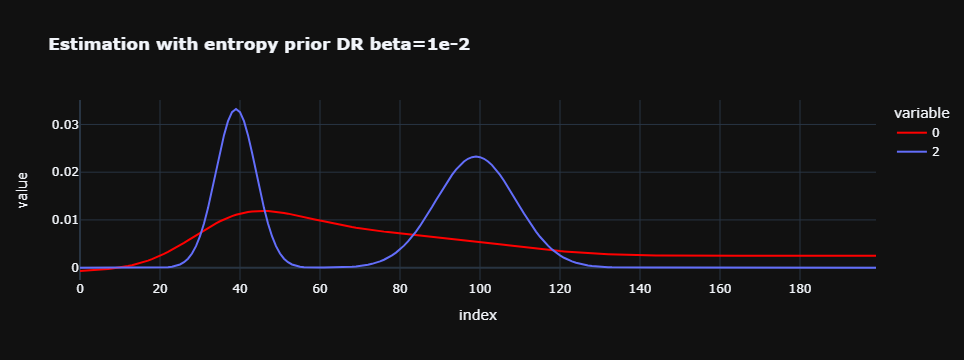

In [331]:
plot_estim(
    f_estime_ent_dr(1e-2),
    origin_signal, name = "Estimation with entropy prior DR beta=1e-2"
)

On remarque que la reconstruction n'a pas beaucoup gagné en qualité avec cette méthode: les résultats sont assez similaires avec le Forward Backward.

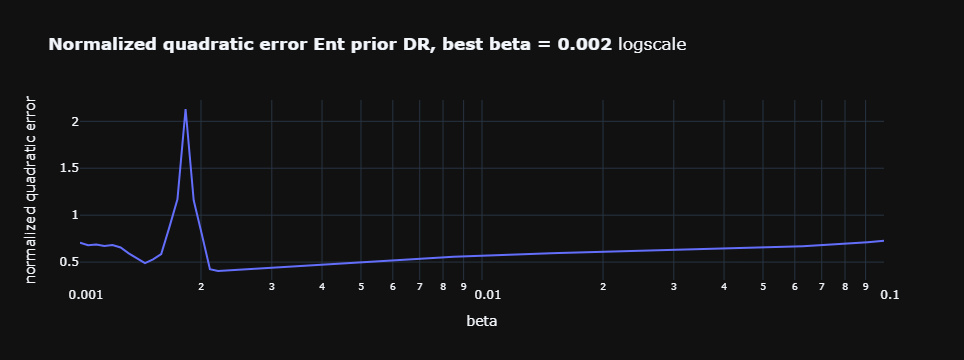

In [333]:
vectorize_and_plot_nqerror(f_estime_ent_dr, range_beta = np.logspace(-3, -1, 100), name = "Ent prior DR")

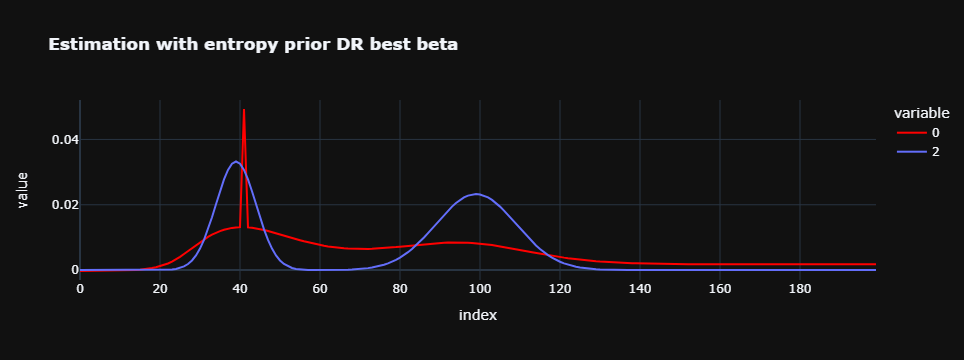

In [346]:
plot_estim(
    douglas_ent_prior(noisy_data, mat_K, beta = 2e-3, maxiter=1000),
    origin_signal, name = "Estimation with entropy prior DR best beta"
)

On observe une singularité aux approximations dans la construction du proximal de l'entropy. Une implémentation plus robuste de la fonction de Lambert semble être nécessaire pour obtenir de meilleures reconstructions.

### 7-Comparaison des méthodes

|                    **Algorithm**                   | **Best Beta** | **Best normalized quadratic error** |
|:--------------------------------------------------:|:-------------:|:-----------------------------------:|
| Smoothness prior                                   | 0.498         | 0.38                                |
| **Smoothness prior + constraints**                 | 0.658         | 0.315                               |
| Sparsity prior                                     | 0.152         | 0.438                               |
| Maximum entropy regularization (Forward Backward)  | 0.006         | 0.54                                |
| Maximum entropy regularization (Douglas Rachford)  | 0.002         | 0.399                               |

Des améliorations dans le choix des hyperparamètres et sur l'implémentation des opérateurs sont à réaliser. En l'état actuel, Smoothness prior + constraints est le plus performant des algorithmes pour notre tache. On peut cependant remarquer que cette implémentation utilise une connaissance du signal à reconstruire concernant sont interval.

### 8-PPXA

Enfin regardons la méthode PPXA qui est une extension de Douglas Rachford.

In [336]:
def ppxa_ent(y, mat_K, beta = 1e-2, maxiter=1000):  
    sigma = 1e-2
    # γ = 1e-2
    # lmbda = lambda n : 0.8
    γ = 0.1
    lmbda = lambda n : 1.7
    
    mat2 = mat_K.T @mat_K
    inv_mat_mult = lambda u1, u2 : np.linalg.inv(np.eye(mat2.shape[0]) + mat2) @ (u1+ mat_K.T @ u2)
    prox1 = lambda v : prox_gamma_entropy(v,γ*beta)
    prox2 = lambda v : y + (v - y) * np.min([1, sigma * np.sqrt(M * η) / np.linalg.norm(v - y)])
    
    x0 = np.ones(200)
    vn = inv_mat_mult(x0, x0)
    xn_1 = x0.copy()
    xn_2 = x0.copy()
    
    for n in range(maxiter):
        u1 = prox1(xn_1)
        u2 = prox2(xn_2)
        c = inv_mat_mult(u1, u2)
        xn_1 += lmbda(n) * ((2*c-vn)-u1)
        xn_2 += lmbda(n) * (mat_K @(2*c-vn)-u2)
        vn += lmbda(n) * (c-vn)
    return vn

f_estime_ent_ppxa = lambda beta: douglas_ent_prior(noisy_data, mat_K, beta = beta, maxiter=1000)

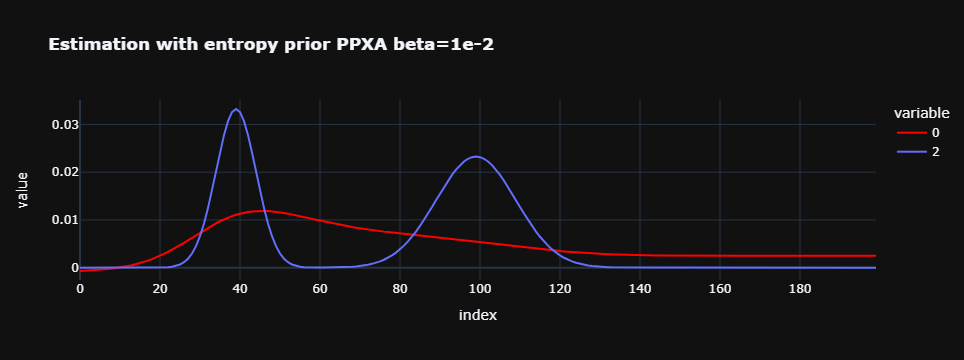

In [308]:
plot_estim(
    f_estime_ent_ppxa(1e-2),
    origin_signal, name = "Estimation with entropy prior PPXA beta=1e-2"
)

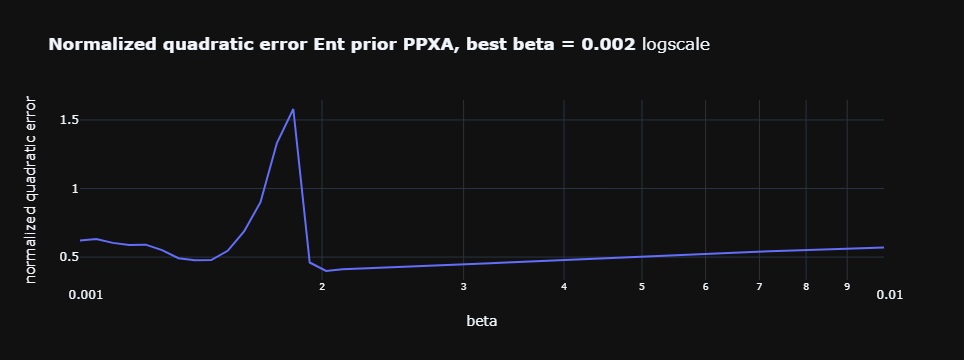

In [348]:
vectorize_and_plot_nqerror(f_estime_ent_ppxa, range_beta = np.logspace(-3, -2, 50), name = "Ent prior PPXA")

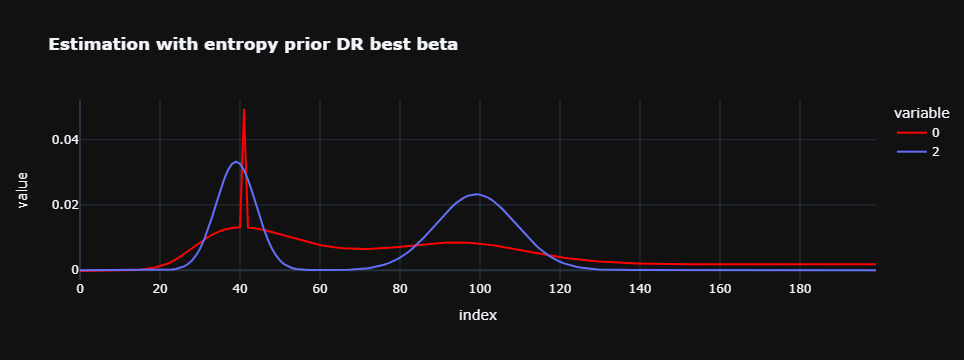

In [350]:
plot_estim(
    f_estime_ent_ppxa(2e-3),
    origin_signal, name = "Estimation with entropy prior DR best beta"
)

Cette implémentation est la meilleure pour ce problème d'optimisation, et est cohérente avec l'algorithme précédent.Cependant la construction du proximal associé à l'entropy est toujours une source d'erreur importante.